In [1]:
import matplotlib.pyplot as plt
from matplotlib import rcParams
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
rcParams['figure.figsize'] = (12,6)

import os
import torch

import numpy as np
import pandas as pd
import seaborn as sns

from torchvision.datasets import MNIST
from torchvision import transforms

from spiking import *

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [3]:
# Define the network
net = SpikingLGN(num_retina_layers=1, num_lgn_layers=1, num_neurons_retina=1500, num_neurons_lgn=400,
                 square_size=28, neighbourhood_size=(3, 5), num_timesteps=1200, device=device)

In [4]:
# Define a random input
# inp = torch.rand((1, 1, 28, 28))

In [5]:
# Load the image from the MNIST dataset
train_dataset = MNIST('./data', train=True, download=True, transform=transforms.Compose([transforms.ToTensor()]))
inp = train_dataset[0][0][None, :, :, :]  # Returns a tuple
print(inp.shape)

torch.Size([1, 1, 28, 28])


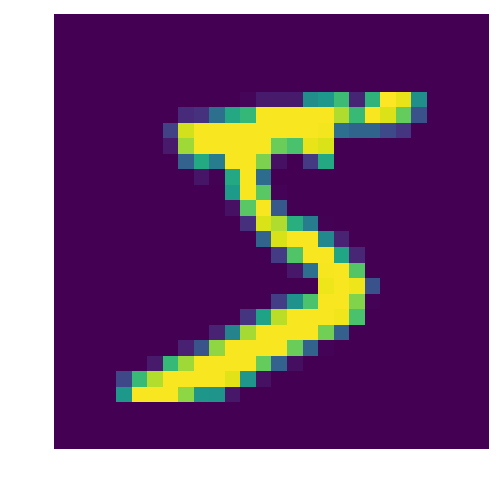

In [6]:
plt.axis('off')
plt.imshow(inp.cpu()[0, 0])

In [7]:
# Move everything to the desired device
net = net.to(device)
inp = inp.to(device)

In [8]:
# Forward prop through the network
out = net(inp)
out = np.array(out)

(1200, 1500) 0.035671666


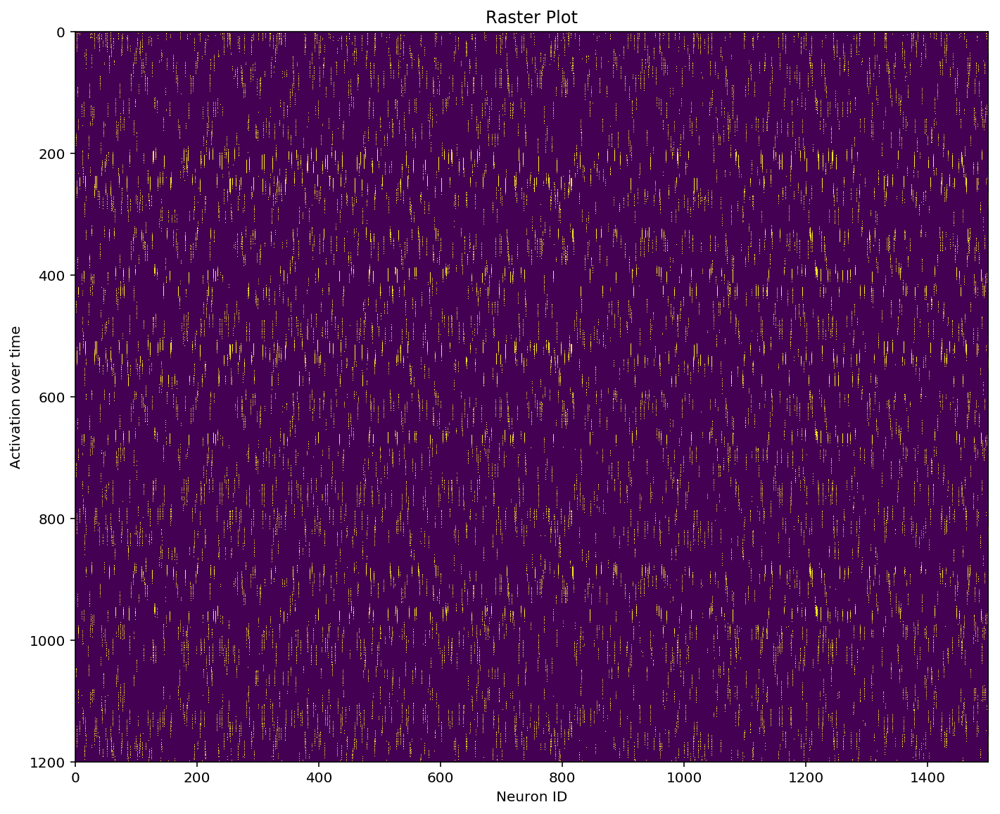

In [9]:
fig_size = 10
plt.figure(figsize=(fig_size, fig_size))
print(out.shape, np.mean(out))
plt.imshow(out)
plt.title('Raster Plot')
plt.xlabel('Neuron ID')
plt.ylabel('Activation over time')
plt.tight_layout()
plt.savefig('activation.png', bbox_inches='tight', dpi=300)

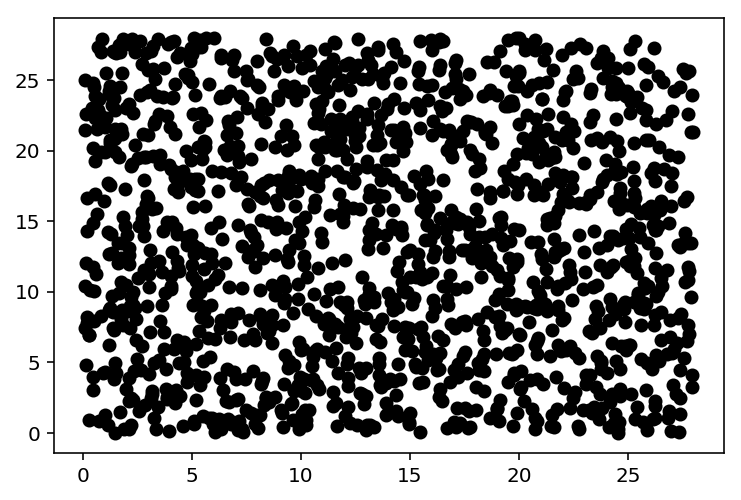

In [10]:
neuron_pos = np.stack([n.pos.cpu().numpy() for n in net.layer[0].nodes], axis=0)    
fig = plt.figure()
plt.scatter(neuron_pos[:,0], neuron_pos[:,1], color='k')

<Figure size 432x288 with 0 Axes>

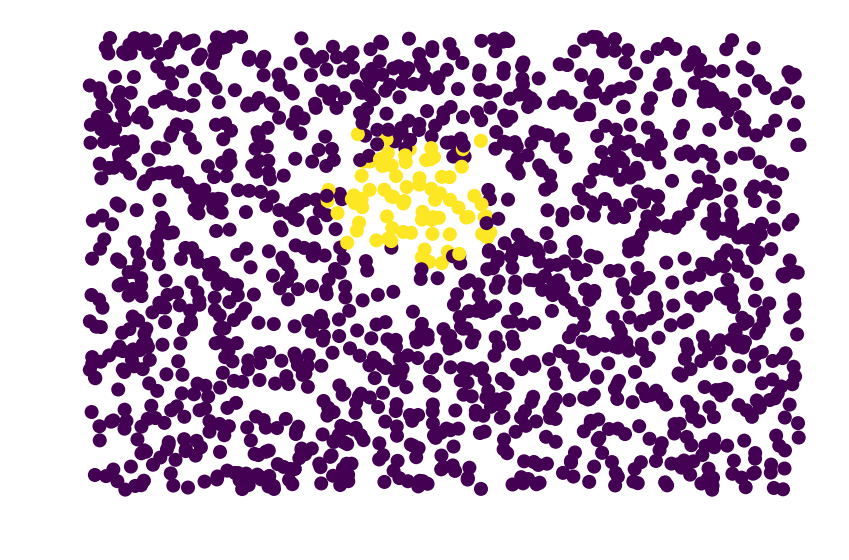

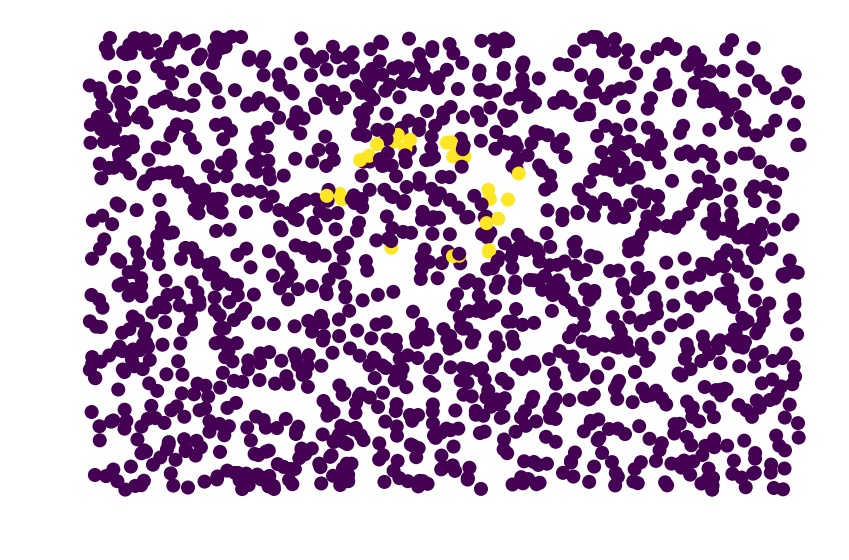

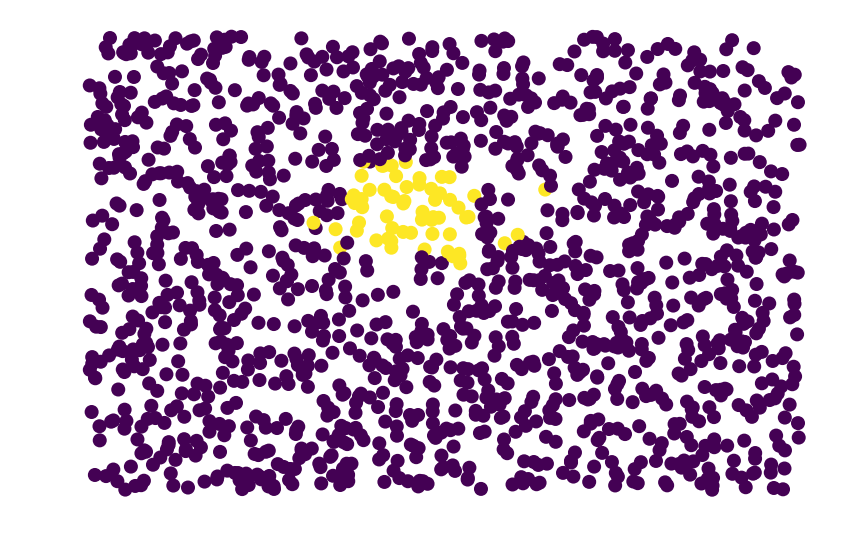

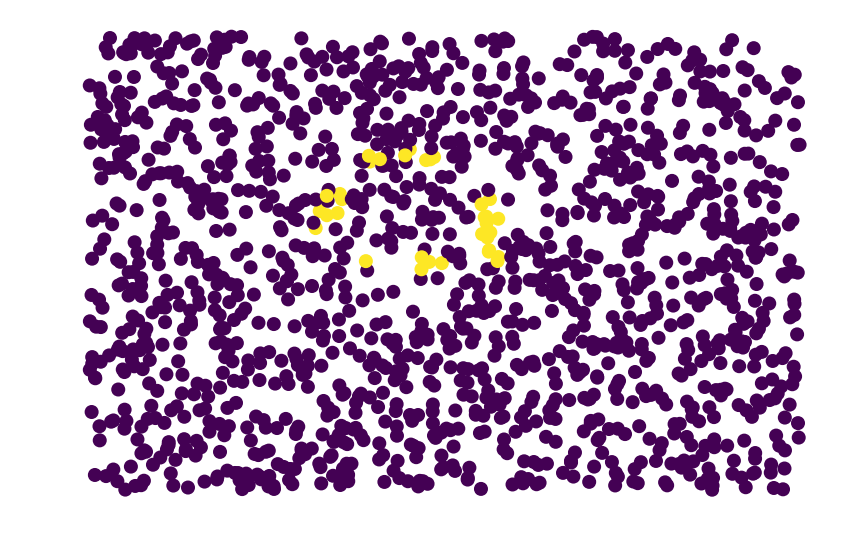

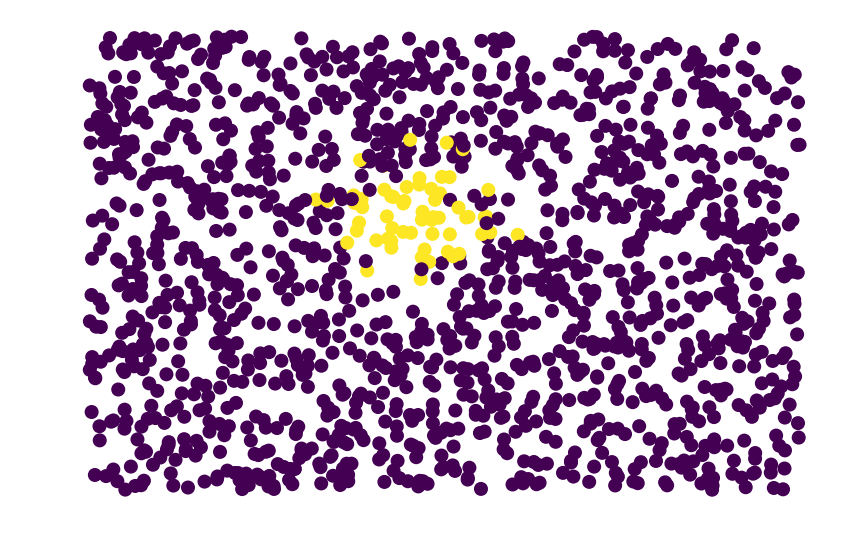

...

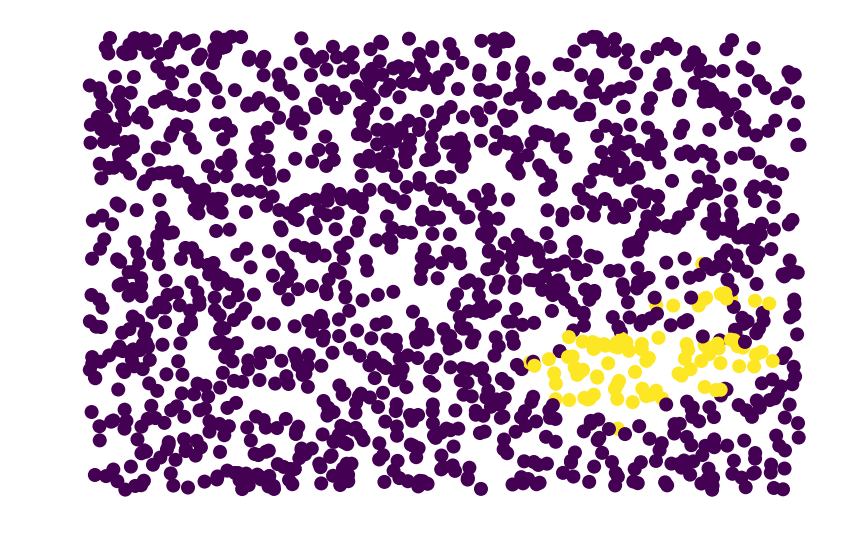

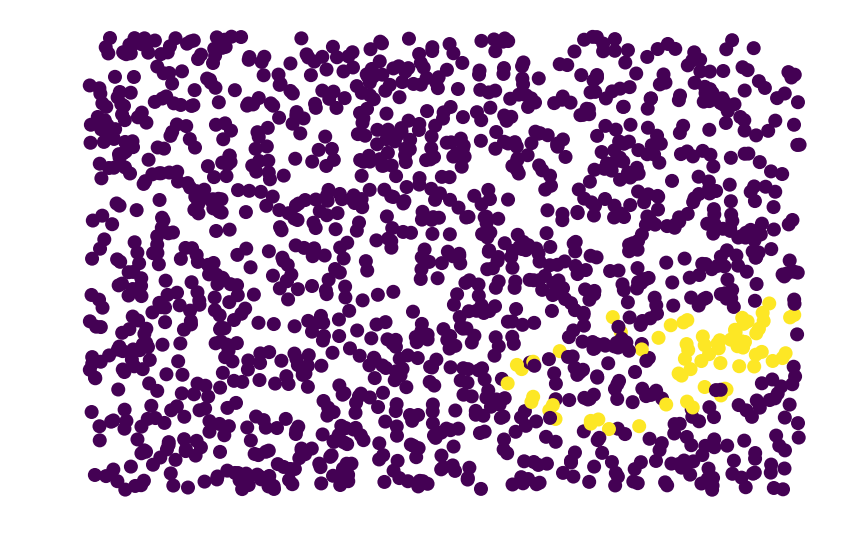

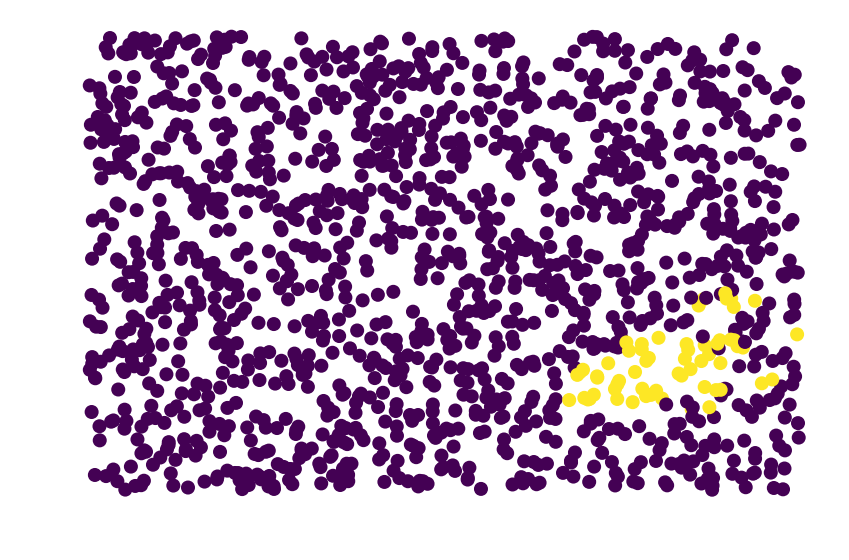

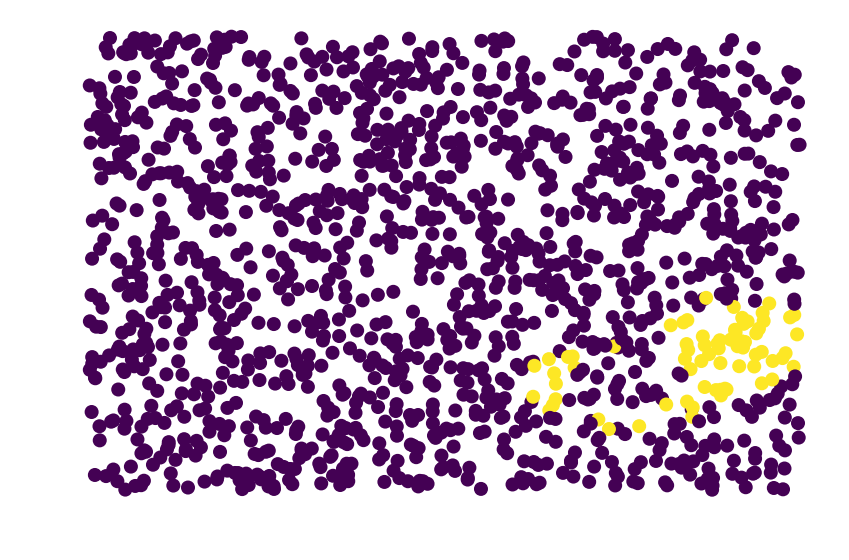

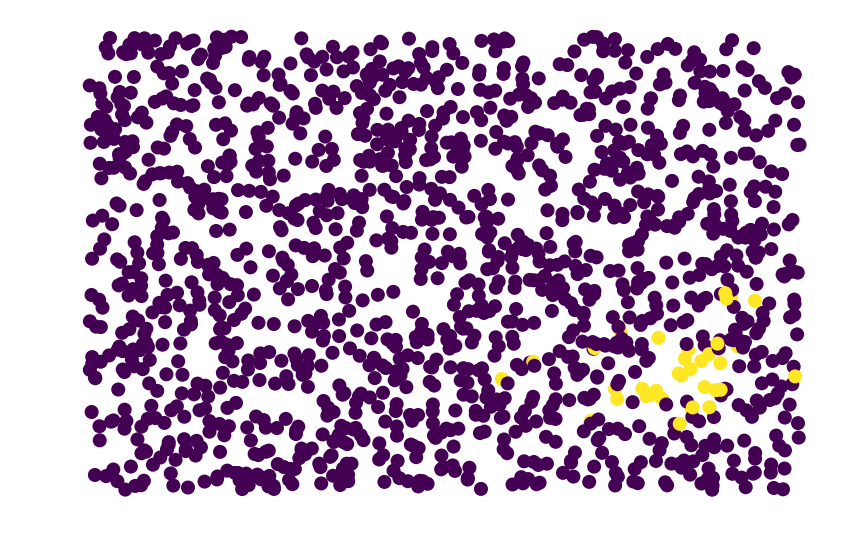

In [11]:
l = net.layer[0]
fig = plt.figure()

output_dir = 'frames'
if not os.path.exists(output_dir):
    os.mkdir(output_dir)

# Plot all values
for i in range(out.shape[0]):
    # Find spiking nodes at t=i
    plt.figure()
#     flat_idx = np.argwhere(out[i, :] > 0).reshape(-1)
#     if len(flat_idx) > 0:
#         pos_firing = np.stack([l.nodes[j].pos.cpu().numpy() for j in flat_idx], axis=0)

#         plt.scatter(neuron_pos[:, 0], neuron_pos[:, 1], color='k')
#         plt.scatter(pos_firing[:, 0], pos_firing[:, 1], color='r')
#     else:
#         plt.scatter(neuron_pos[:, 0], neuron_pos[:, 1], color='k')
    plt.scatter(neuron_pos[:, 0], neuron_pos[:, 1], c=out[i, :])
    plt.axis('off')
    plt.tight_layout()
    plt.savefig(f'{output_dir}/{i}.png', bbox_inches='tight', pad_inches=0.0)
    
    if 500 < i <= 550:
        plt.show()
    
    plt.close()

In [ ]:
# Convert the frames to a GIF
# !convert -resize 640x360 -delay 20 -loop 0 frames/{0..1199}.png out.gif